# MLP Clustering Analysis (incl. alternative explanations)

In [1]:
%load_ext autoreload
%autoreload 1

In [2]:
import sys
sys.path.append('..')

import matplotlib.pylab as plt
import pandas as pd
from tqdm import tqdm
from IPython import display

from src.visualization import draw_mlp_clustering_report, run_double_spectral_cluster
from src.utils import get_weights_paths, build_clustering_results
from src.experiment_tagging import get_model_path, MODEL_TAG_LOOKUP
from src.spectral_cluster_model import SHUFFLE_METHODS

In [3]:
clustering_results = {}

model_tags = (tag for tag in MODEL_TAG_LOOKUP.keys()
              if 'CNN' not in tag)
#print(list(model_tags))
mlp_model_paths = {model_tag: get_model_path(model_tag) for model_tag in model_tags}

  0%|          | 0/20 [00:00<?, ?it/s]

  5%|▌         | 1/20 [08:38<2:44:05, 518.20s/it]

 10%|█         | 2/20 [17:07<2:34:38, 515.49s/it]

 15%|█▌        | 3/20 [25:23<2:24:25, 509.74s/it]

 20%|██        | 4/20 [33:53<2:15:57, 509.85s/it]

 25%|██▌       | 5/20 [42:34<2:08:14, 512.99s/it]

 30%|███       | 6/20 [52:09<2:04:03, 531.65s/it]

 35%|███▌      | 7/20 [1:01:03<1:55:22, 532.48s/it]

 40%|████      | 8/20 [1:09:50<1:46:10, 530.85s/it]

 45%|████▌     | 9/20 [1:18:44<1:37:27, 531.57s/it]

 50%|█████     | 10/20 [1:27:43<1:29:00, 534.04s/it]

 55%|█████▌    | 11/20 [1:36:38<1:20:08, 534.24s/it]

 60%|██████    | 12/20 [1:45:08<1:10:16, 527.10s/it]

 65%|██████▌   | 13/20 [1:53:36<1:00:49, 521.29s/it]

 70%|███████   | 14/20 [2:02:31<52:32, 525.37s/it]  

 75%|███████▌  | 15/20 [2:11:18<43:48, 525.79s/it]

 80%|████████  | 16/20 [2:19:56<34:53, 523.41s/it]

 85%|████████▌ | 17/20 [2:28:43<26:13, 524.66s/it]

 90%|█████████ | 18/20 [2:37:27<17:28, 524.39s/it]

 95%|█████████▌| 19/20 [2:46:16<08:45, 525.62s/it]

100%|██████████| 20/20 [2:55:01<00:00, 525.45s/it]

100%|██████████| 20/20 [2:55:01<00:00, 525.05s/it]

CPU times: user 20min 35s, sys: 21min 45s, total: 42min 21s
Wall time: 2h 55min 1s


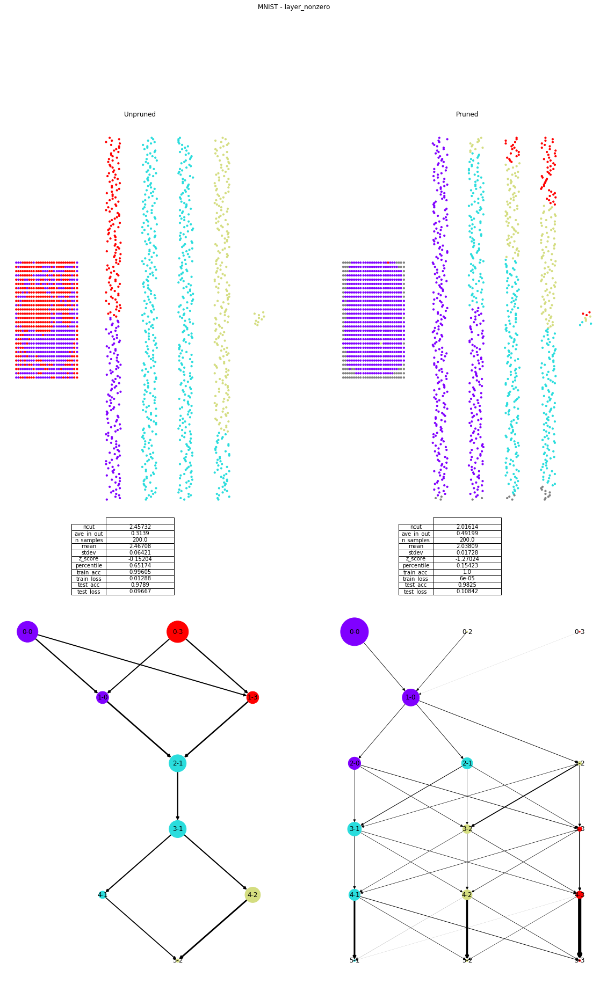

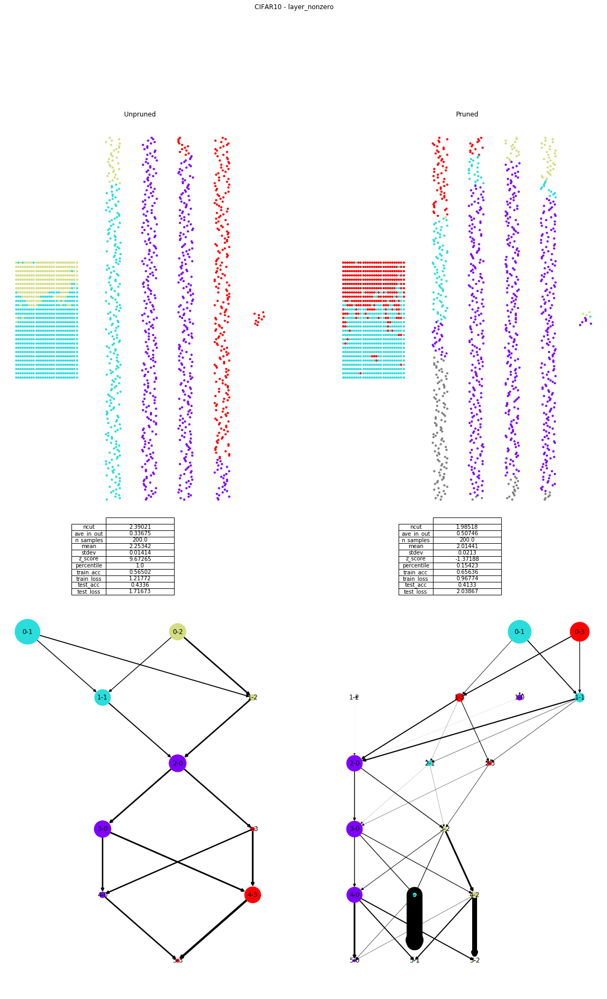

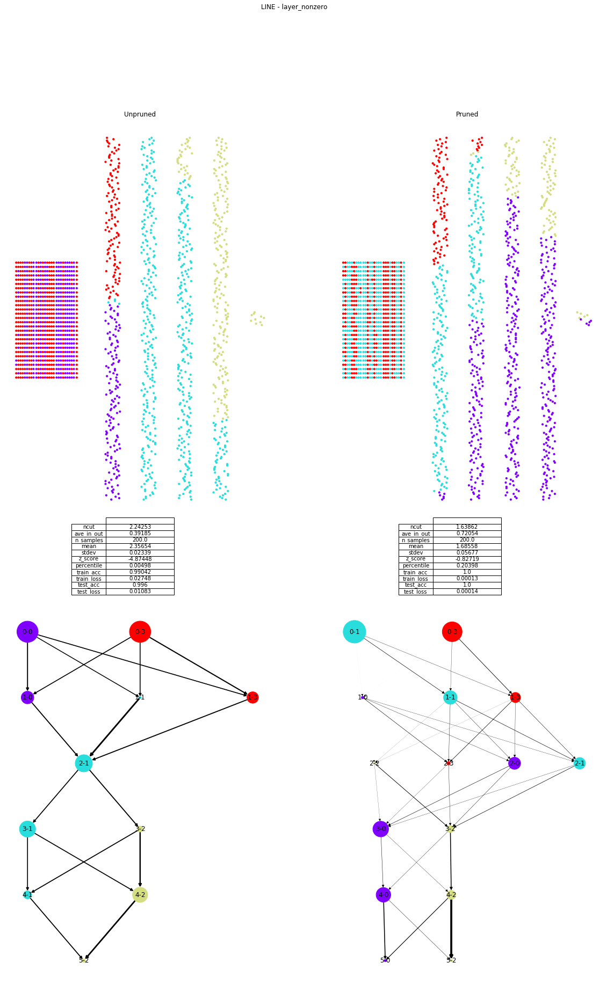

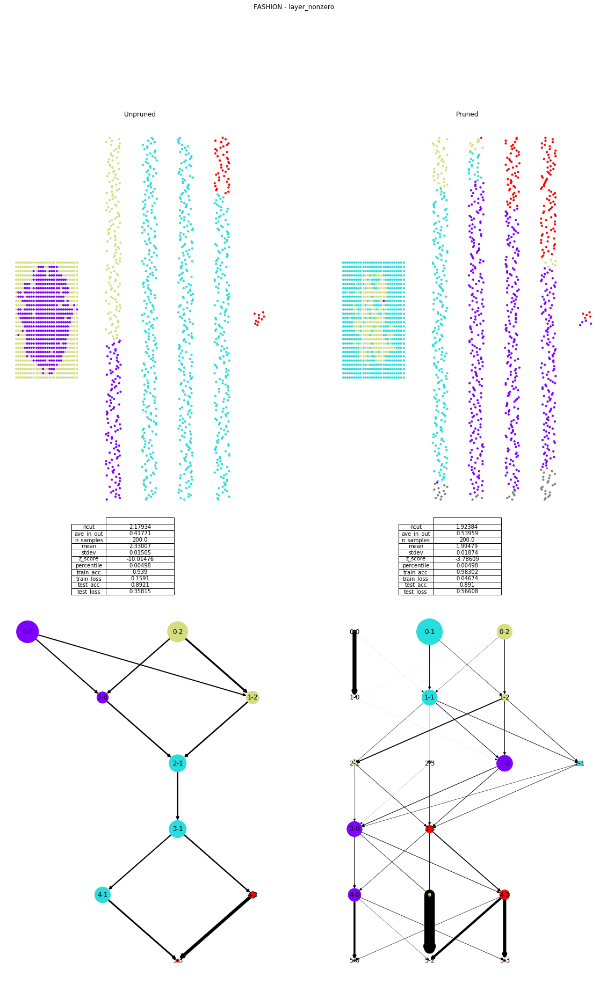

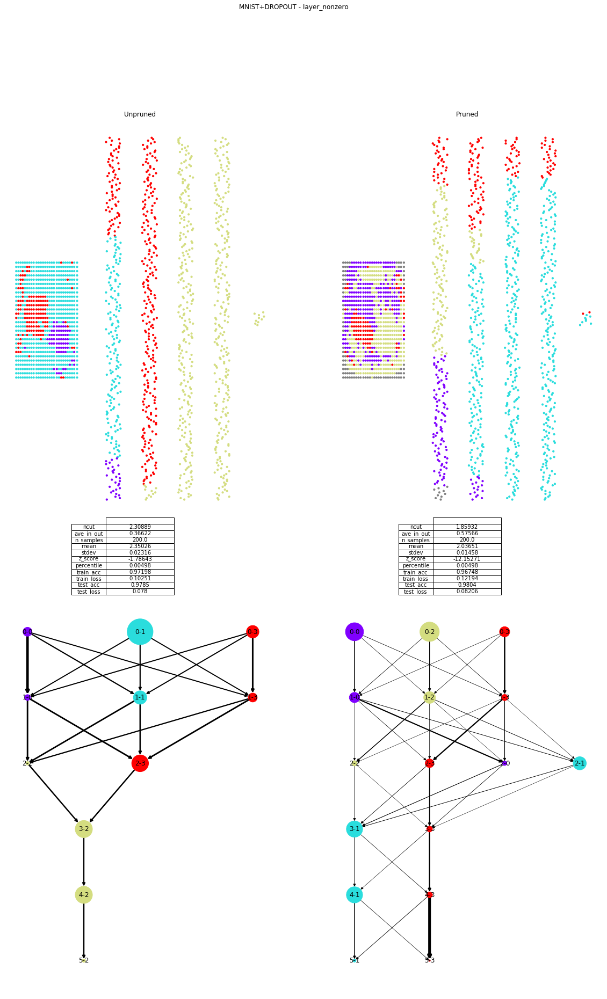

...

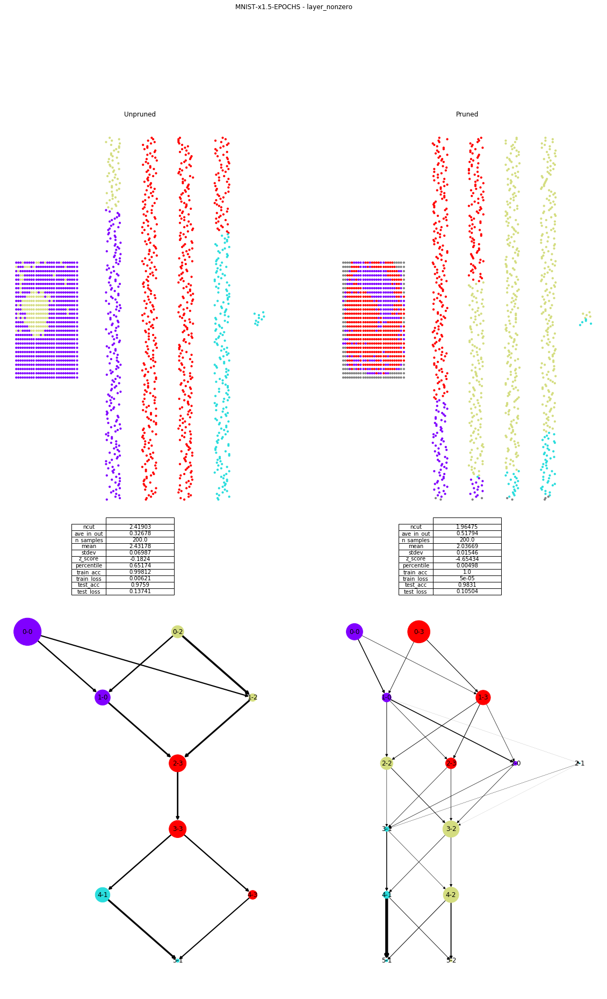

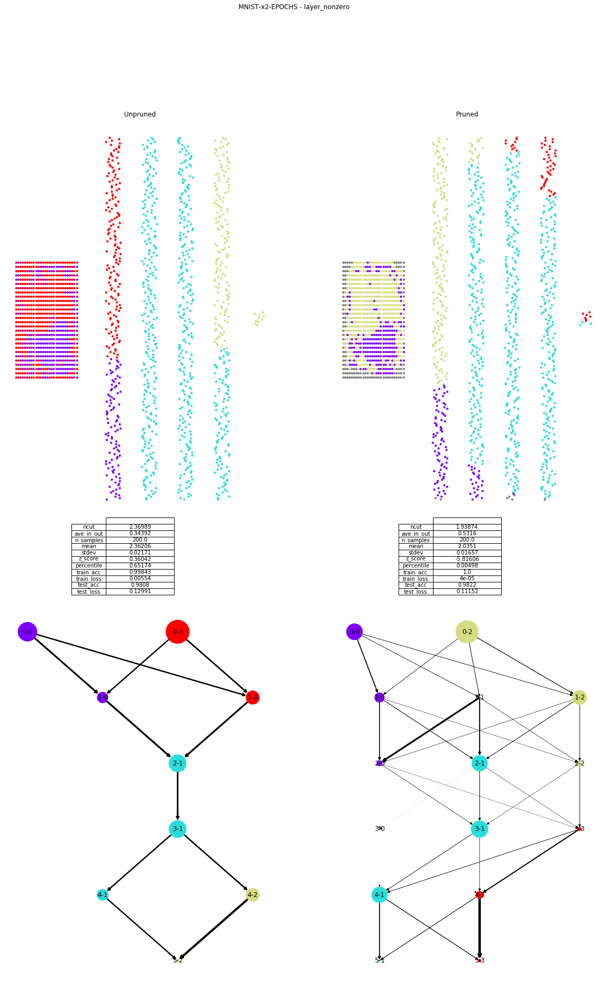

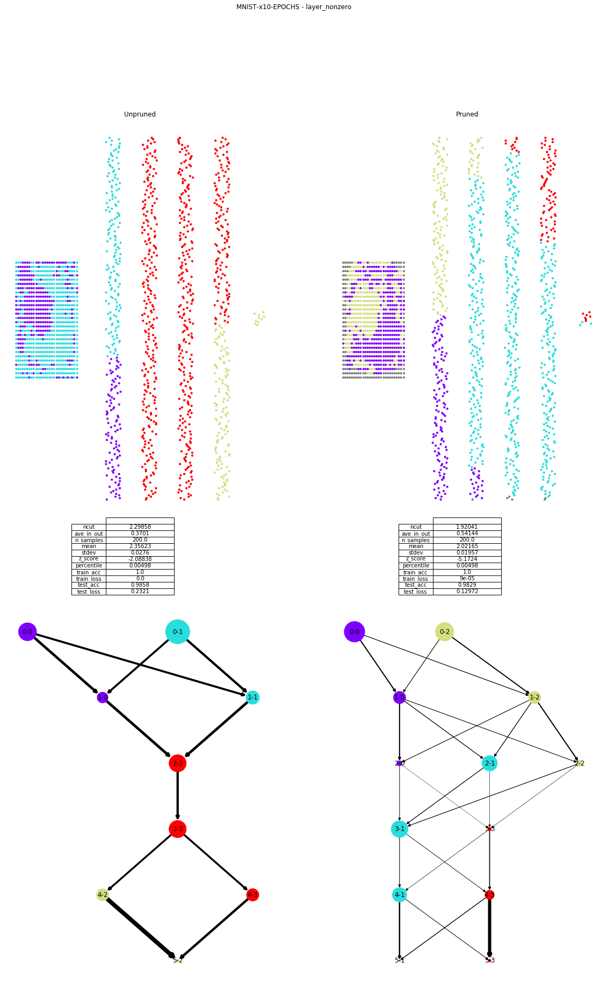

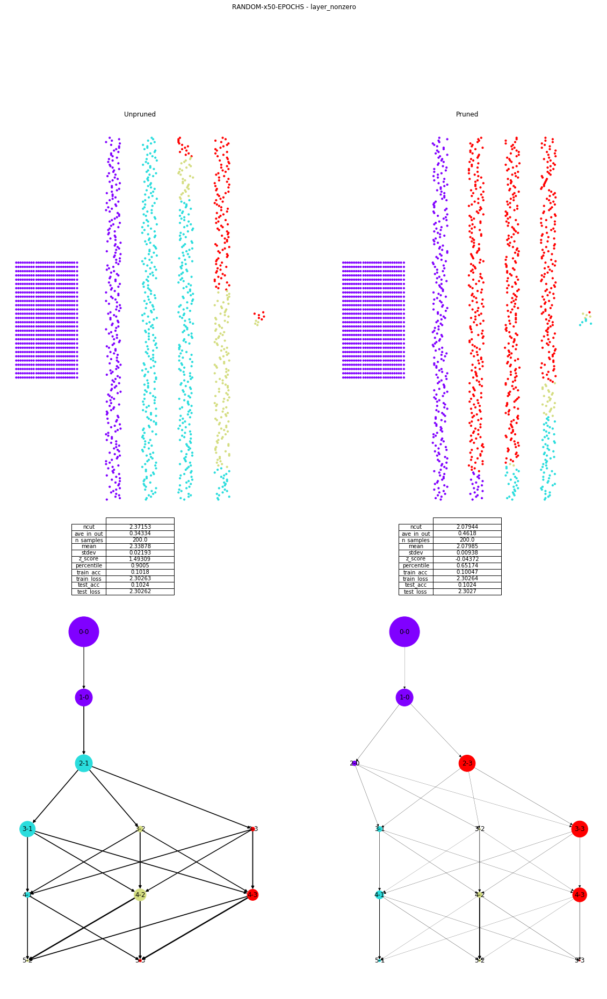

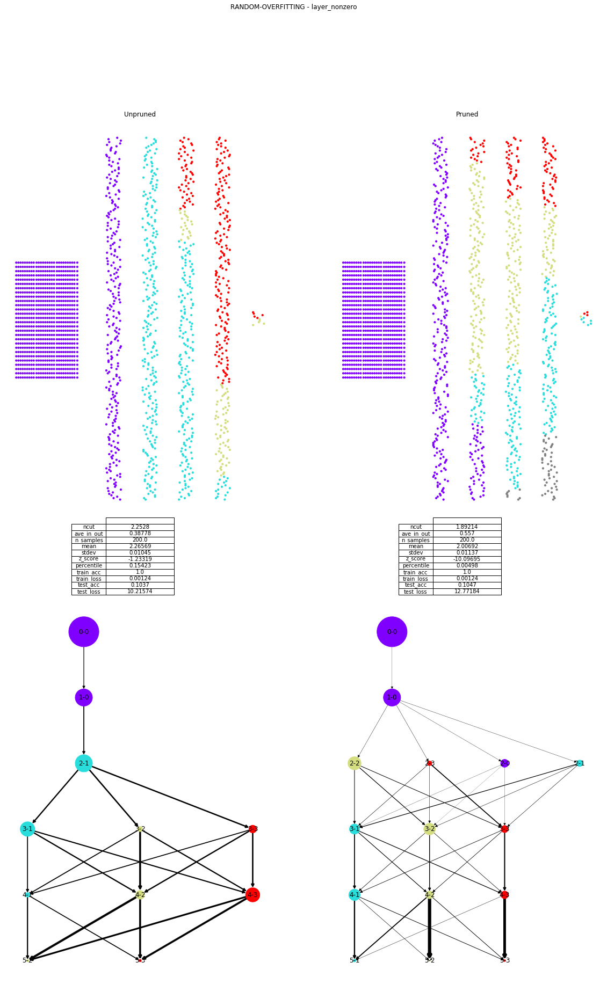

In [4]:
%%time

for model_name, path in tqdm(mlp_model_paths.items()):
    
    clustering_results[model_name] = {}
    
    for shuffle_method in SHUFFLE_METHODS:

        clustering_results[model_name][shuffle_method] = run_double_spectral_cluster(path)

        if shuffle_method == 'layer_nonzero':
            draw_mlp_clustering_report(path,
                                       clustering_results[model_name][shuffle_method],
                                       n_cluster=4, title=f'{model_name} - {shuffle_method}')

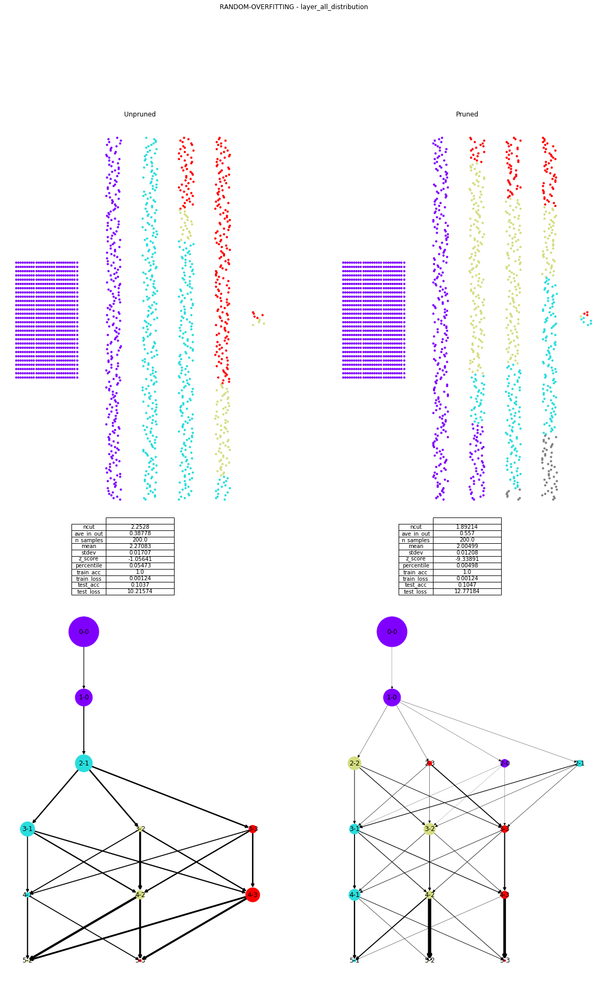

In [5]:
draw_mlp_clustering_report(path,
                           clustering_results[model_name][shuffle_method],
                           n_cluster=4, title=f'{model_name} - {shuffle_method}')

In [6]:
mlp_result_df = build_clustering_results(clustering_results)
mlp_result_df.to_csv('../results/mlp-clustering.csv')
mlp_result_df

,model,network,dropout,is_unpruned,shuffle_method,ncut,ave_in_out,n_samples,mean,stdev,z_score,percentile,train_acc,train_loss,test_acc,test_loss
0,MNIST,MLP,False,False,layer,2.016140,0.491995,200,2.031834,0.019570,-0.801944,0.253731,1.000000,0.000065,0.9825,0.108416
1,MNIST,MLP,False,True,layer,2.457317,0.313896,200,2.494790,0.069874,-0.536285,0.452736,0.996050,0.012876,0.9789,0.096668
2,MNIST,MLP,False,False,layer_nonzero,2.016140,0.491995,200,2.038094,0.017284,-1.270237,0.154229,1.000000,0.000065,0.9825,0.108416
3,MNIST,MLP,False,True,layer_nonzero,2.457317,0.313896,200,2.467080,0.064211,-0.152037,0.651741,0.996050,0.012876,0.9789,0.096668
4,MNIST,MLP,False,False,layer_nonzero_distribution,2.016140,0.491995,200,2.038290,0.020640,-1.073134,0.154229,1.000000,0.000065,0.9825,0.108416
5,MNIST,MLP,False,True,layer_nonzero_distribution,2.457317,0.313896,200,2.476303,0.066997,-0.283390,0.651741,0.996050,0.012876,0.9789,0.096668
6,MNIST,MLP,False,False,layer_all_distribution,2.016140,0.491995,200,2.047174,0.008592,-3.612087,0.004975,1.000000,0.000065,0.9825,0.108416
7,MNIST,MLP,False,True,layer_all_distribution,2.457317,0.313896,200,2.441180,0.037378,0.431732,0.800995,0.996050,0.012876,0.9789,0.096668
8,CIFAR10,MLP,False,False,layer,1.985183,0.507464,200,2.015870,0.014316,-2.143478,0.004975,0.656360,0.967735,0.4133,2.038671
9,CIFAR10,MLP,False,True,layer,2.390210,0.336746,200,2.257312,0.013186,10.078773,1.000000,0.565020,1.217719,0.4336,1.716729
